### Project : Advanced Lane Finding

Steps involved:

1. Camera calibration
2. Undistortion of images
3. Thresholding
4. Perspective transform

Camera Calibration with OpenCV
===

### Run the code in the cell below to extract object points and image points for camera calibration.  

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

def find_img_obj_points():
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (9,6), corners, ret)
            #write_name = 'corners_found'+str(idx)+'.jpg'
            #cv2.imwrite(write_name, img)
            #cv2.imshow('img', img)
            #cv2.waitKey(500)
    return objpoints, imgpoints

### If the above cell ran sucessfully, you should now have `objpoints` and `imgpoints` needed for camera calibration.  Run the cell below to calibrate, calculate distortion coefficients, and test undistortion on an image!

In [2]:
import pickle
%matplotlib inline

def calibrate_camera(objpoints, imgpoints):
    # Test undistortion on an image
    img = cv2.imread('test_images/test1.jpg')
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    save_matrices(mtx, dist)
    return mtx, dist
    
def undistort_img(img, mtx, dist):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    #cv2.imwrite('test_images/test1.jpg',dst)
    return dst
    
def save_matrices(mtx, dist):
    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ))

17
17


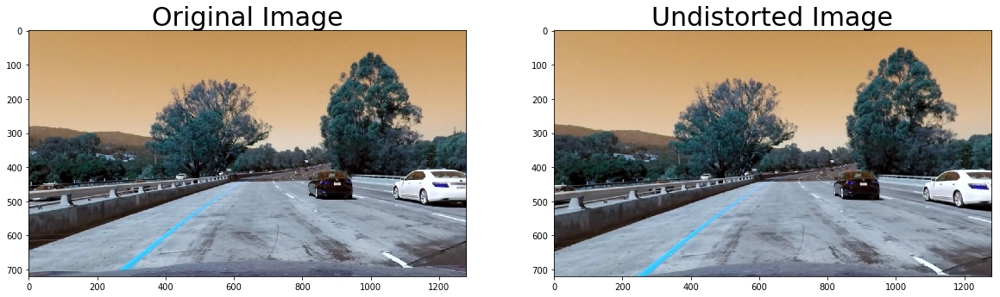

In [3]:
objpoints, imgpoints = find_img_obj_points()

print(len(objpoints))
print(len(imgpoints))
mtx, dist = calibrate_camera(objpoints, imgpoints)

img = cv2.imread('test_images/test1.jpg')
dst_img = undistort_img(img, mtx, dist)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst_img)
ax2.set_title('Undistorted Image', fontsize=30)

## Perspective Transform

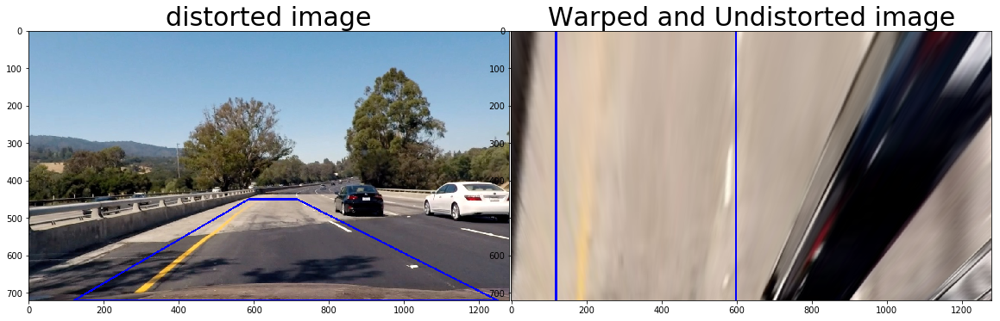

In [4]:
def draw_lines(img, vertices):
    pts= np.int32([vertices])
    cv2.polylines(img, pts, True, (0,0,255), thickness= 4)

def calc_warp_points(img_height,img_width,x_center_adj=0):
    
    # calculator the vertices of the region of interest
    imshape = (img_height, img_width)
    xcenter=imshape[1]/2+x_center_adj
    
    xfd=54
    xfd_r = 75
    yf=450
    xoffset = 120
    xoffset_l=120
    xoffset_r = 30
    
    src = np.float32(
        [(xoffset,imshape[0]),
         (xcenter-xfd, yf), 
         (xcenter+xfd_r,yf), 
         (imshape[1]-xoffset_r,imshape[0])])
        
    dst = np.float32(
        [(xoffset,imshape[1]),
         (xoffset,0),
         (imshape[0]-xoffset, 0),
        (imshape[0]-xoffset,imshape[1])])
        
    return src, dst


def perspective_transform(img):
    h,w = img.shape[:2]
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    
    src, dst = calc_warp_points(h, w)

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv

img = cv2.imread('test_images/test4.jpg')
h,w = img.shape[:2]
src, dst = calc_warp_points(h, w)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = undistort_img(img, mtx, dist)
img_unwarp, M, Minv = perspective_transform(img)

draw_lines(img,src)
draw_lines(img_unwarp,dst)

fig, axs = plt.subplots(1,2, figsize=(20, 10))
fig.subplots_adjust(hspace = .005, wspace=.005)
axs = axs.ravel()
axs[0].imshow(img)
axs[0].set_title('distorted image', fontsize=30)
axs[1].imshow(img_unwarp)
axs[1].set_title('Warped and Undistorted image', fontsize=30)


## Sobel Threshold (Absolute)

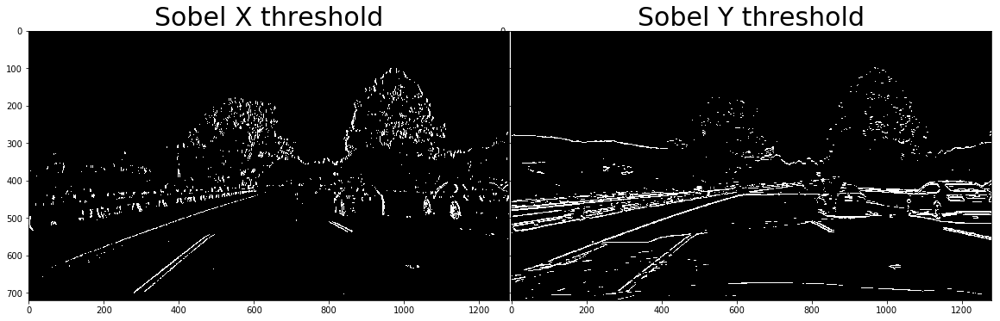

In [5]:
# Calculate directional gradient
def abs_sobel_thresh(img, orient='x', sobel_kernel=7, thresh=(0, 255)):
    gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
    # Apply x or y gradient
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute values
    sobel = np.absolute(sobel)
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*sobel/np.max(sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > thresh[0]) & (scaled_sobel < thresh[1])] = 1
    # Return the result
    return binary_output

img = cv2.imread('test_images/test4.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = undistort_img(img, mtx, dist)

img_sobelAbs_x = abs_sobel_thresh(img, orient = 'x', thresh=(40, 200))
img_sobelAbs_y = abs_sobel_thresh(img, orient = 'y', thresh=(50, 200))

#exampleImg_sobelAbs_unwarp = abs_sobel_thresh(exampleImg_unwarp, orient = 'x', thresh=(25, 255))
fig, axs = plt.subplots(1,2, figsize=(20, 10))
fig.subplots_adjust(hspace = .005, wspace=.005)
axs = axs.ravel()
axs[0].imshow(img_sobelAbs_x, cmap = 'gray')
axs[0].set_title('Sobel X threshold', fontsize=30)
axs[1].imshow(img_sobelAbs_y, cmap = 'gray')
axs[1].set_title('Sobel Y threshold', fontsize=30)


## Sobel Threshold (Magnitude)

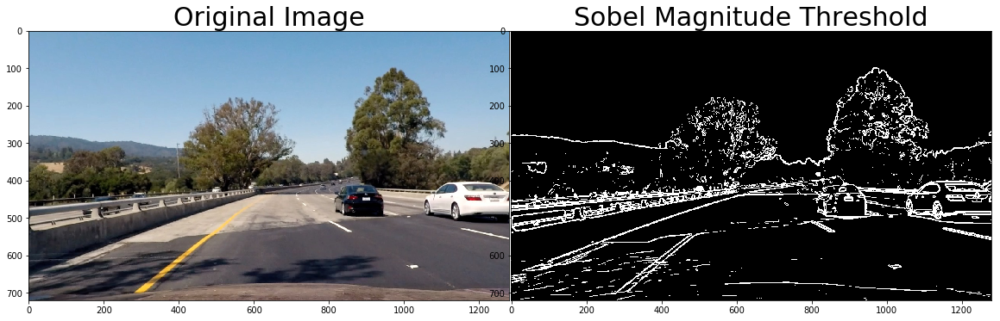

In [6]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=7, mag_thresh=(0, 255)):
    gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
    # Apply x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    sobel = np.sqrt(sobelx ** 2 + sobely ** 2)
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*sobel/np.max(sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > mag_thresh[0]) & (scaled_sobel < mag_thresh[1])] = 1
    # Return the result
    return binary_output


img = cv2.imread('test_images/test4.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = undistort_img(img, mtx, dist)
img_sobelMag = mag_thresh(img, mag_thresh=(40, 255))
fig, axs = plt.subplots(1,2, figsize=(20, 10))
fig.subplots_adjust(hspace = .005, wspace=.005)
axs = axs.ravel()
axs[0].imshow(img, cmap = 'gray')
axs[0].set_title('Original Image', fontsize=30)
axs[1].imshow(img_sobelMag, cmap = 'gray')
axs[1].set_title('Sobel Magnitude Threshold', fontsize=30)

## Sobel Threshold (Directional)

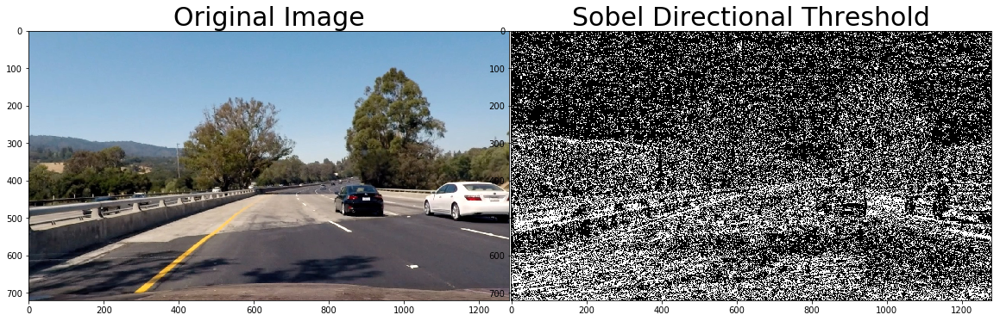

In [7]:
# Calculate gradient direction
def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
    # Apply x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Error statement to ignore division and invalid errors
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.absolute(np.arctan(sobely/sobelx))
        dir_binary =  np.zeros_like(absgraddir)
        dir_binary[(absgraddir > thresh[0]) & (absgraddir < thresh[1])] = 1
    # Return the result
    return dir_binary

img = cv2.imread('test_images/test4.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = undistort_img(img, mtx, dist)
img_sobelDir = dir_thresh(img, thresh=(1.05, 1.5))
fig, axs = plt.subplots(1,2, figsize=(20, 10))
fig.subplots_adjust(hspace = .005, wspace=.005)
axs = axs.ravel()
axs[0].imshow(img, cmap = 'gray')
axs[0].set_title('Original Image', fontsize=30)
axs[1].imshow(img_sobelDir, cmap = 'gray')
axs[1].set_title('Sobel Directional Threshold', fontsize=30)

## Sobel Threshold (Combined)

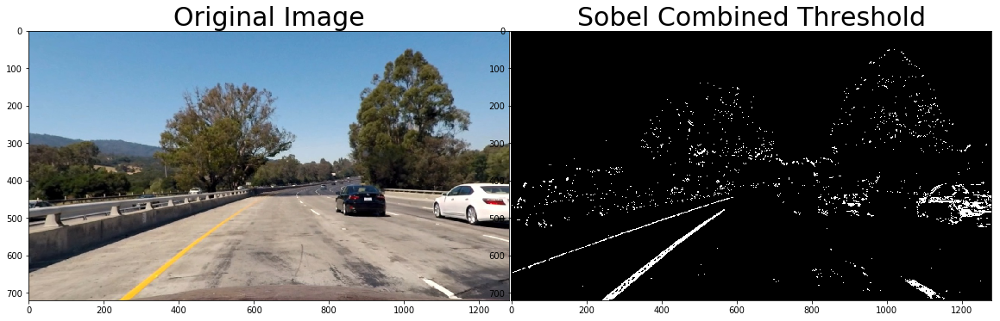

In [8]:
# Edit this function to create your own pipeline.
def combined_threshold(img):     
    # Gaussian Blur
    kernel_size = 5
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    # Define sobel kernel size
    ksize = 7
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(40, 200))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(50, 200))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(40, 255))
    dir_binary = dir_thresh(img, sobel_kernel=ksize, thresh=(.85, 1.05))
    # Combine all the thresholding information
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    # Threshold color channel
    s_binary = np.zeros_like(combined)
    s_binary[(s > 160) & (s < 255)] = 1
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors    
    color_binary = np.zeros_like(combined)
    color_binary[(s_binary > 0) | (combined > 0)] = 1
    # Defining vertices for marked area
    
    '''
    imshape = img.shape
    left_bottom = (100, imshape[0])
    right_bottom = (imshape[1]-20, imshape[0])
    apex1 = (610, 410)
    apex2 = (680, 410)
    inner_left_bottom = (310, imshape[0])
    inner_right_bottom = (1150, imshape[0])
    inner_apex1 = (700,480)
    inner_apex2 = (650,480)
    vertices = np.array([[left_bottom, apex1, apex2, \
                          right_bottom, inner_right_bottom, \
                          inner_apex1, inner_apex2, inner_left_bottom]], dtype=np.int32)
    # Masked area
    color_binary = region_of_interest(color_binary, vertices)'''
    return color_binary

img = cv2.imread('test_images/test1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = undistort_img(img, mtx, dist)
img_sobelCombined = combined_threshold(img)
fig, axs = plt.subplots(1,2, figsize=(20, 10))
fig.subplots_adjust(hspace = .005, wspace=.005)
axs = axs.ravel()
axs[0].imshow(img, cmap = 'gray')
axs[0].set_title('Original Image', fontsize=30)
axs[1].imshow(img_sobelCombined, cmap = 'gray')
axs[1].set_title('Sobel Combined Threshold', fontsize=30)

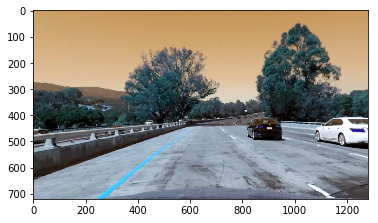

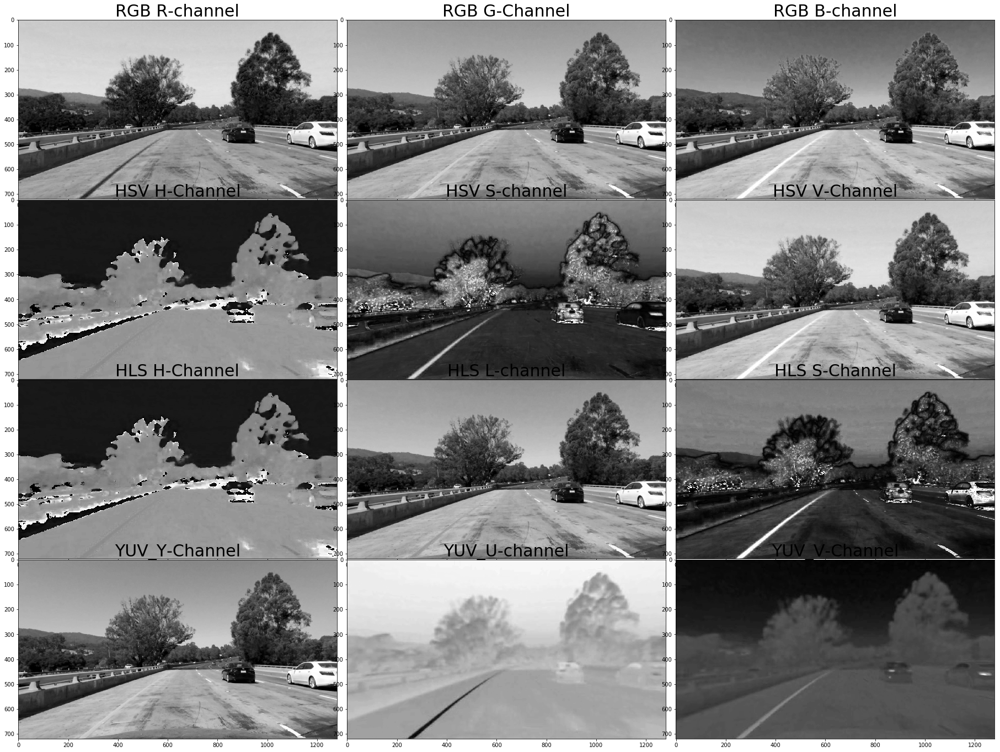

In [9]:
#Color Space visuallization

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

# Visualize multiple color space channels
#RGB color channel
img_R = img[:,:,0]
img_G = img[:,:,1]
img_B = img[:,:,2]

#HSV color channel
img_HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_HSV_H = img_HSV[:,:,0]
img_HSV_S = img_HSV[:,:,1]
img_HSV_V = img_HSV[:,:,2]

#HLS color channel
img_HLS = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
img_HLS_H = img_HLS[:,:,0]
img_HLS_L = img_HLS[:,:,1]
img_HLS_S = img_HLS[:,:,2]

#YUV color channel
img_YUV = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
img_YUV_Y = img_YUV[:,:,0]
img_YUV_U = img_YUV[:,:,1]
img_YUV_V = img_YUV[:,:,2]


fig, axs = plt.subplots(4,3, figsize=(32, 24))
fig.subplots_adjust(hspace = .005, wspace=.005)
axs = axs.ravel()
axs[0].imshow(img_R, cmap='gray')
axs[0].set_title('RGB R-channel', fontsize=30)
axs[1].imshow(img_G, cmap='gray')
axs[1].set_title('RGB G-Channel', fontsize=30)
axs[2].imshow(img_B, cmap='gray')
axs[2].set_title('RGB B-channel', fontsize=30)

axs[3].imshow(img_HSV_H, cmap='gray')
axs[3].set_title('HSV H-Channel', fontsize=30)
axs[4].imshow(img_HSV_S, cmap='gray')
axs[4].set_title('HSV S-channel', fontsize=30)
axs[5].imshow(img_HSV_V, cmap='gray')
axs[5].set_title('HSV V-Channel', fontsize=30)

axs[6].imshow(img_HLS_H, cmap='gray')
axs[6].set_title('HLS H-Channel', fontsize=30)
axs[7].imshow(img_HLS_L, cmap='gray')
axs[7].set_title('HLS L-channel', fontsize=30)
axs[8].imshow(img_HLS_S, cmap='gray')
axs[8].set_title('HLS S-Channel', fontsize=30)

axs[9].imshow(img_YUV_Y, cmap='gray')
axs[9].set_title('YUV_Y-Channel', fontsize=30)
axs[10].imshow(img_YUV_U, cmap='gray')
axs[10].set_title('YUV_U-channel', fontsize=30)
axs[11].imshow(img_YUV_V, cmap='gray')
axs[11].set_title('YUV_V-Channel', fontsize=30)

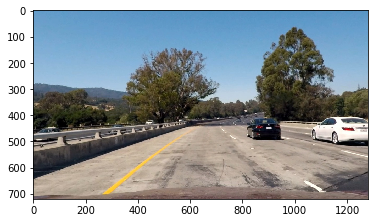

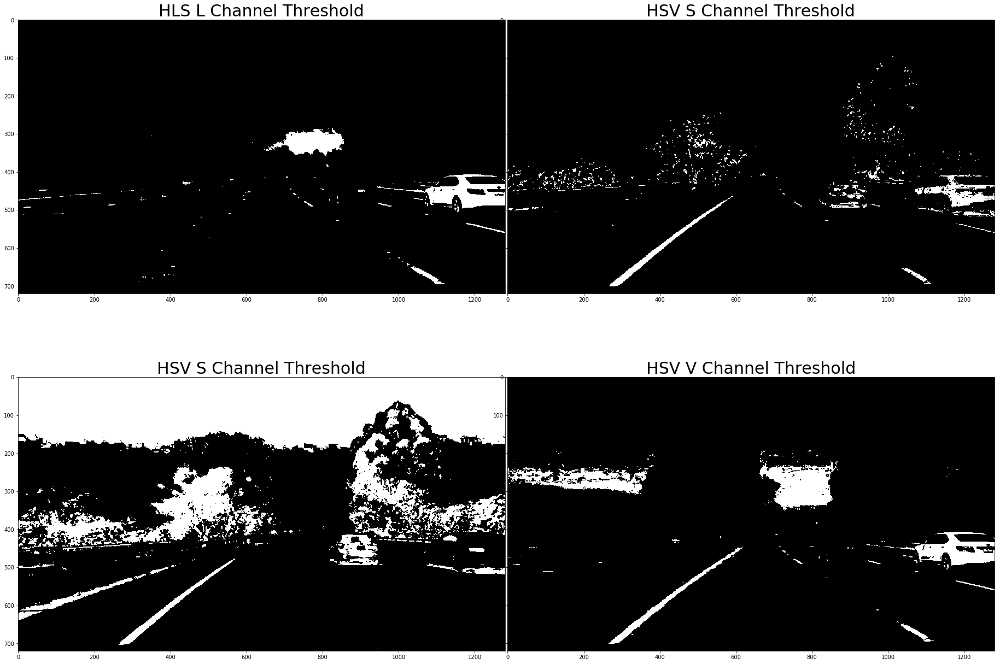

In [11]:
#HLS S chaannel color space thresholding
def hls_sthresh(img, thresh=(150, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(hls[:,:,2])
    binary_output[(hls[:,:,2] > thresh[0]) & (hls[:,:,2] <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

#HLS L chaannel color space thresholding
def hls_lthresh(img, thresh=(200, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

#HSV S chaannel color space thresholding
def hsv_sthresh(img, thresh=(100, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

#HSV V chaannel color space thresholding
def hsv_vthresh(img, thresh=(220, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hls_l = hls[:,:,2]
    hls_l = hls_l*(255/np.max(hls_l))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

img = cv2.imread('test_images/test1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_thresh_HLS_L = hls_lthresh(img)
img_thresh_HLS_S = hls_sthresh(img)

img_thresh_HSV_S = hsv_sthresh(img)
img_thresh_HSV_V = hsv_vthresh(img)

plt.imshow(img)

fig, axs = plt.subplots(2,2, figsize=(32, 24))
fig.subplots_adjust(hspace = .005, wspace=.005)
axs = axs.ravel()
axs[0].imshow(img_thresh_HLS_L, cmap='gray')
axs[0].set_title('HLS L Channel Threshold', fontsize=30)
axs[1].imshow(img_thresh_HLS_S, cmap='gray')
axs[1].set_title('HSV S Channel Threshold', fontsize=30)

axs[2].imshow(img_thresh_HSV_S, cmap='gray')
axs[2].set_title('HSV S Channel Threshold', fontsize=30)
axs[3].imshow(img_thresh_HSV_V, cmap='gray')
axs[3].set_title('HSV V Channel Threshold', fontsize=30)


## Pipeline

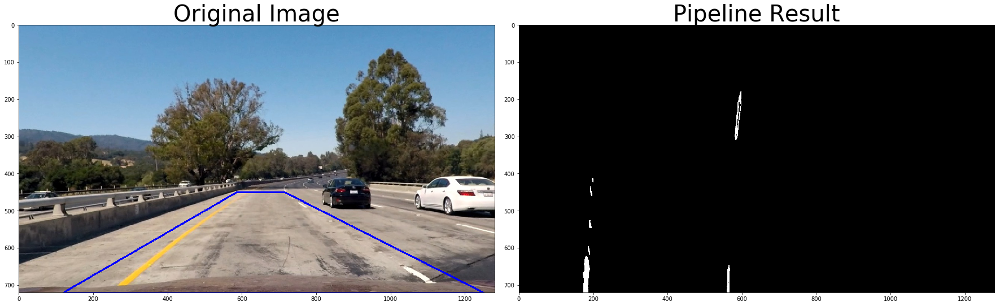

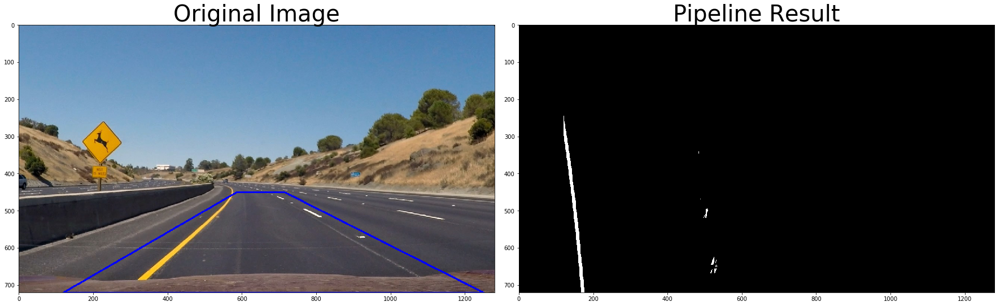

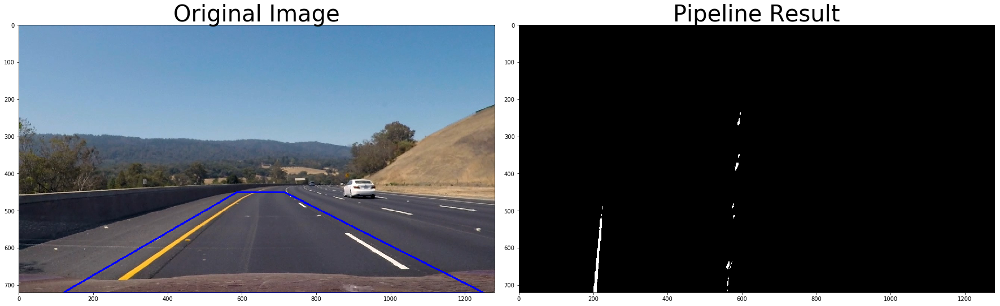

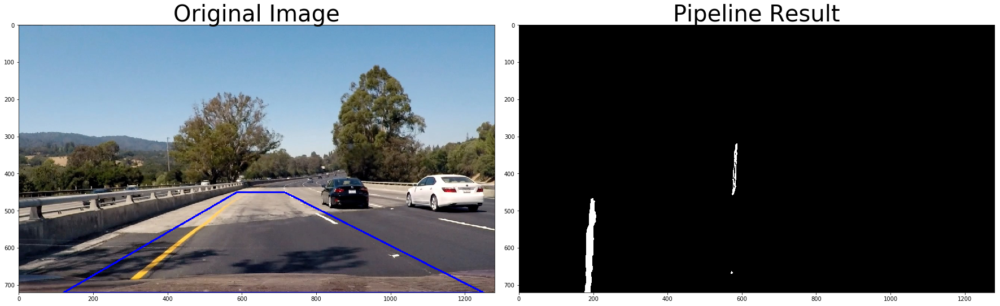

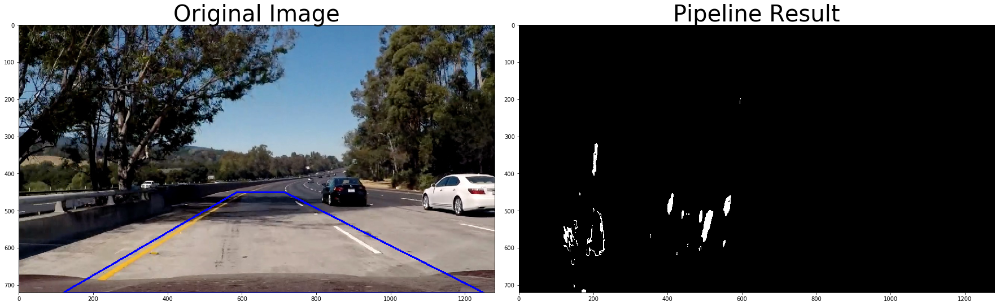

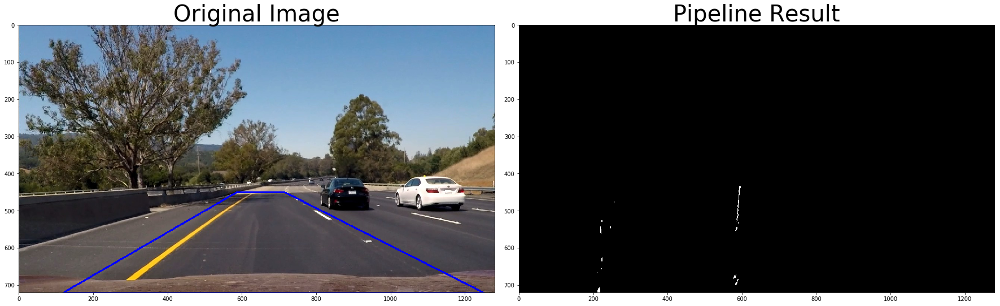

In [15]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def pipeline(img):
    combined_threshold_img = combined_threshold(img)
    h,w = img.shape[:2]
    src, dst = calc_warp_points(h, w)
    src= np.int32([src])
    dst= np.int32([dst])
    img_unwarp, M, Minv = perspective_transform(img)
    #roi_img = region_of_interest(combined_threshold_img, src)
    #return roi_img
    img_sobelCombined = combined_threshold(img_unwarp)
    roi_img = region_of_interest(img_sobelCombined, dst)
    return roi_img


for i in range(1,7):
    fname = 'test_images/test{}.jpg'.format(i)
    image = cv2.imread(fname)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result = pipeline(image)
    
    draw_lines(image,src)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [18]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        #x values in windows
        self.windows = np.ones((3,12))*-1

In [19]:
def find_curvature(yvals, fitx):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(yvals)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    fit_cr = np.polyfit(yvals*ym_per_pix, fitx*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval + fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*fit_cr[0])
    return curverad

def find_position(pts):
    # Find the position of the car from the center
    # It will show if the car is 'x' meters from the left or right
    position = image_shape[1]/2
    left  = np.min(pts[(pts[:,1] < position) & (pts[:,0] > 700)][:,1])
    right = np.max(pts[(pts[:,1] > position) & (pts[:,0] > 700)][:,1])
    center = (left + right)/2
    # Define conversions in x and y from pixels space to meters
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension    
    return (position - center)*xm_per_pix

In [20]:
def find_nearest(array,value):
    # Function to find the nearest point from array
    if len(array) > 0:
        idx = (np.abs(array-value)).argmin()
        return array[idx]

def find_peaks(image, y_window_top, y_window_bottom, x_left, x_right):
    
    plt.imshow(image)
    # Find the historgram from the image inside the window
    #print('image shape->', image.shape, ' | ', y_window_top, ' | ', y_window_bottom)
    histogram = np.sum(image[int(y_window_top):int(y_window_bottom),:], axis=0)
    # Find the max from the histogram
    if len(histogram[int(x_left):int(x_right)])>0:
        return np.argmax(histogram[int(x_left):int(x_right)]) + x_left
    else:
        return (x_left + x_right) / 2        

def sanity_check(lane, curverad, fitx, fit):       
    # Sanity check for the lane
    if lane.detected: # If lane is detected
        # If sanity check passes
        if abs(curverad / lane.radius_of_curvature - 1) < .6:        
            lane.detected = True
            lane.current_fit = fit
            lane.allx = fitx
            lane.bestx = np.mean(fitx)            
            lane.radius_of_curvature = curverad
            lane.current_fit = fit
        # If sanity check fails use the previous values
        else:
            lane.detected = False
            fitx = lane.allx
    else:
        # If lane was not detected and no curvature is defined
        if lane.radius_of_curvature: 
            if abs(curverad / lane.radius_of_curvature - 1) < 1:            
                lane.detected = True
                lane.current_fit = fit
                lane.allx = fitx
                lane.bestx = np.mean(fitx)            
                lane.radius_of_curvature = curverad
                lane.current_fit = fit
            else:
                lane.detected = False
                fitx = lane.allx      
        # If curvature was defined
        else:
            lane.detected = True
            lane.current_fit = fit
            lane.allx = fitx
            lane.bestx = np.mean(fitx)
            lane.radius_of_curvature = curverad
    return fitx

# Sanity check for the direction
def sanity_check_direction(right, right_pre, right_pre2):
    # If the direction is ok then pass
    if abs((right-right_pre) / (right_pre-right_pre2) - 1) < .2:
        return right
    # If not then compute the value from the previous values
    else:
        return right_pre + (right_pre - right_pre2)
    
# find_lanes function will detect left and right lanes from the warped image.
# 'n' windows will be used to identify peaks of histograms    
def find_lanes(n, image, x_window, lanes, \
               left_lane_x, left_lane_y, right_lane_x, right_lane_y, window_ind):
    # 'n' windows will be used to identify peaks of histograms
    # Set index1. This is used for placeholder.
    index1 = np.zeros((n+1,2))
    index1[0] = [300, 1100]
    index1[1] = [300, 1100]
    # Set the first left and right values
    left, right = (300, 1100)
    # Set the center
    center = 700
    # Set the previous center
    center_pre = center
    # Set the direction
    direction = 0
    for i in range(n-1):
        # set the window range.
        y_window_top = 720-720/n*(i+1)
        y_window_bottom = 720-720/n*i
        # If left and right lanes are detected from the previous image
        if (left_lane.detected==False) and (right_lane.detected==False):
            # Find the historgram from the image inside the window
            left  = find_peaks(image, y_window_top, y_window_bottom, index1[i+1,0]-200, index1[i+1,0]+200)
            right = find_peaks(image, y_window_top, y_window_bottom, index1[i+1,1]-200, index1[i+1,1]+200)
            # Set the direction
            left  = sanity_check_direction(left, index1[i+1,0], index1[i,0])
            right = sanity_check_direction(right, index1[i+1,1], index1[i,1]) 
            # Set the center
            center_pre = center
            center = (left + right)/2
            direction = center - center_pre
        # If both lanes were detected in the previous image
        # Set them equal to the previous one
        else:
            left  = left_lane.windows[window_ind, i]
            right = right_lane.windows[window_ind, i]
        # Make sure the distance between left and right laens are wide enough
        if abs(left-right) > 600:
            # Append coordinates to the left lane arrays
            left_lane_array = lanes[(lanes[:,1]>=left-x_window) & (lanes[:,1]<left+x_window) &
                                 (lanes[:,0]<=y_window_bottom) & (lanes[:,0]>=y_window_top)]
            left_lane_x += left_lane_array[:,1].flatten().tolist()
            left_lane_y += left_lane_array[:,0].flatten().tolist()
            if not math.isnan(np.mean(left_lane_array[:,1])):
                left_lane.windows[window_ind, i] = np.mean(left_lane_array[:,1])
                index1[i+2,0] = np.mean(left_lane_array[:,1])
            else:
                index1[i+2,0] = index1[i+1,0] + direction
                left_lane.windows[window_ind, i] = index1[i+2,0]
            # Append coordinates to the right lane arrays            
            right_lane_array = lanes[(lanes[:,1]>=right-x_window) & (lanes[:,1]<right+x_window) &
                                  (lanes[:,0]<y_window_bottom) & (lanes[:,0]>=y_window_top)]
            right_lane_x += right_lane_array[:,1].flatten().tolist()
            right_lane_y += right_lane_array[:,0].flatten().tolist()
            if not math.isnan(np.mean(right_lane_array[:,1])):
                right_lane.windows[window_ind, i] = np.mean(right_lane_array[:,1])
                index1[i+2,1] = np.mean(right_lane_array[:,1])
            else:
                index1[i+2,1] = index1[i+1,1] + direction
                right_lane.windows[window_ind, i] = index1[i+2,1]
    return left_lane_x, left_lane_y, right_lane_x, right_lane_y


In [21]:
import math
# Function to find the fitting lines from the warped image
def fit_lanes(image):
    # define y coordinate values for plotting
    yvals = np.linspace(0, 100, num=101)*7.2  # to cover same y-range as image
    # find the coordinates from the image
    lanes = np.argwhere(image)
    # Coordinates for left lane
    left_lane_x = []
    left_lane_y = []
    # Coordinates for right lane
    right_lane_x = []
    right_lane_y = []
    # Curving left or right - -1: left 1: right
    curve = 0
    # Set left and right as None
    left = None
    right = None
    # Find lanes from three repeated procedures with different window values
    left_lane_x, left_lane_y, right_lane_x, right_lane_y \
        = find_lanes(4, image, 25, lanes, \
                     left_lane_x, left_lane_y, right_lane_x, right_lane_y, 0)
    left_lane_x, left_lane_y, right_lane_x, right_lane_y \
        = find_lanes(6, image, 50, lanes, \
                     left_lane_x, left_lane_y, right_lane_x, right_lane_y, 1)
    left_lane_x, left_lane_y, right_lane_x, right_lane_y \
        = find_lanes(8, image, 75, lanes, \
                     left_lane_x, left_lane_y, right_lane_x, right_lane_y, 2)
    # Find the coefficients of polynomials
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]
    # Find curvatures
    left_curverad  = find_curvature(yvals, left_fitx)
    right_curverad = find_curvature(yvals, right_fitx)
    # Sanity check for the lanes
    left_fitx  = sanity_check(left_lane, left_curverad, left_fitx, left_fit)
    right_fitx = sanity_check(right_lane, right_curverad, right_fitx, right_fit)
    
    return yvals, left_fitx, right_fitx, left_lane_x, left_lane_y, right_lane_x, right_lane_y, left_curverad

In [22]:
# draw poly on an image
# def draw_poly(image, warped, yvals, left_fitx, right_fitx, Minv):
def draw_poly(image, warped, yvals, left_fitx, right_fitx, 
              left_lane_x, left_lane_y, right_lane_x, right_lane_y, Minv, curvature):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    # Put text on an image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature: {} m".format(int(curvature))
    cv2.putText(result,text,(400,100), font, 1,(255,255,255),2)
    # Find the position of the car
    pts = np.argwhere(newwarp[:,:,1])
    position = find_position(pts)
    if position < 0:
        text = "Vehicle is {:.2f} m left of center".format(-position)
    else:
        text = "Vehicle is {:.2f} m right of center".format(position)
    cv2.putText(result,text,(400,150), font, 1,(255,255,255),2)
    return result

In [25]:
# This function will color the image
# Input: Original image
# Output: Original image with colored region
def process_image(image):
    # Apply pipeline to the image to create black and white image
    img = pipeline(image)
    #img = undistort(image)
    # Warp the image to make lanes parallel to each other
    #top_down, perspective_M, perspective_Minv = corners_unwarp(img, nx, ny, mtx, dist)
    #top_down, perspective_M, perspective_Minv = unwarp(img, src, dst)
    # Find the lines fitting to left and right lanes
    a, b, c, lx, ly, rx, ry, curvature = fit_lanes(img)
    # Return the original image with colored region
    return draw_poly(image, top_down, a, b, c, lx, ly, rx, ry, perspective_Minv, curvature)

/home/peps/.conda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:59: RuntimeWarning: divide by zero encountered in double_scalars
/home/peps/.conda/envs/carnd-term1/lib/python3.5/site-packages/numpy/core/fromnumeric.py:2889: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/peps/.conda/envs/carnd-term1/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


TypeError: expected non-empty vector for x

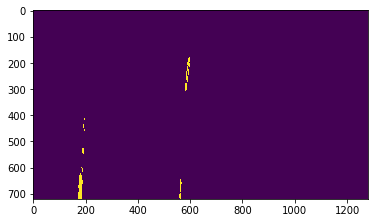

In [27]:
img = cv2.imread('test_images/test1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
left_lane = Line()
right_lane = Line()
result = process_image(img)